# Autoencoders

<p>
CAS on Advanced Machine Learning 2021<br>
Prepared by Dr. Mykhailo Vladymyrov.
</p>

This work is licensed under a <a href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License</a>.


## Libs and utils

In [1]:
from matplotlib import  pyplot as plt
import matplotlib.cm as cm

import numpy as np
import pandas as pd
from imageio import imread
import pickle
from PIL import Image
from time import time as timer
import requests
import zipfile
import time
import os
import glob

from scipy.stats import norm

import tensorflow as tf
import tensorflow.keras.datasets.mnist as mnist
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose, Flatten, Input, Reshape, Cropping2D, Embedding
from tensorflow.keras.layers import LeakyReLU

%matplotlib inline
from matplotlib import animation
from IPython.display import HTML
from IPython.display import Audio
import IPython


#import umap
from scipy.stats import entropy

tf.get_logger().setLevel('ERROR')


In [2]:
# merging 2d matrix of images in 1 image
def mosaic(mtr_of_ims):
  ny = len(mtr_of_ims)
  assert(ny != 0)

  nx = len(mtr_of_ims[0])
  assert(nx != 0)

  im_sh = mtr_of_ims[0][0].shape

  assert (2 <= len(im_sh) <= 3)
  multichannel = len(im_sh) == 3

  if multichannel:
    h, w, c = im_sh
  else:
    h, w = im_sh

  h_c = h * ny + 1 * (ny-1)
  w_c = w * nx + 1 * (nx-1)

  canv_sh = (h_c, w_c, c) if multichannel else (h_c, w_c)
  canvas = np.ones(shape=canv_sh, dtype=np.float32)*0.5

  for iy, row in enumerate(mtr_of_ims):
    y_ofs = iy * (h + 1)
    for ix, im in enumerate(row):
      x_ofs = ix * (w + 1)
      canvas[y_ofs:y_ofs + h, x_ofs:x_ofs + w] = im


  return canvas  

### Load dataset

Lets start with a simple, well understood mnist dataset.

In [3]:
mnist = tf.keras.datasets.mnist
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

In [4]:
# normalize images in [0,1]
train_images = (train_images/255).astype(np.float32)
test_images = (test_images/255).astype(np.float32)

# Helper Autoencoder Interface

We will start from implementing an Autoencoder model base class

In [5]:
class AE(tf.keras.Model):
  def __init__(self, in_size, n_code, noise_rate=0):
    super().__init__()

    self.data_size = list(in_size)  # shape of data sample
    self.flat_data_size = np.prod(self.data_size)
    
    self.noise_rate = min(0.99, max(0, noise_rate)) # noise rate for denoising AE
    self.denoising = self.noise_rate != 0

    self.x_d = None  # variable to keep the input data
    self.xn_d = None # input data with added noise (for DAE)

    self.x_d_val = None  # validation dataset 
    self.c_d_val = None  # class labels for validation dataset

    self.history = {} # training history
    self.sample_history = {}  # history of validation sample evolution in latent space and reconstruction
    self.weights_history = {} # history of model weights (joint model can't be saved at the moment)

    self.out = display(IPython.display.Pretty(''), display_id=True)

    self.last_n_ep = 0  # number of epochs of last fit run

    self.n_code = n_code # number of latent dimensions

    self.encoder = None
    self.decoder = None
    
    self.create()

  def create(self):
    """
    Here the model is built
    """

    # encoder model
    self.encoder = tf.keras.Sequential(
        [
         Input(shape=self.data_size),
         Flatten(),
         Dense(128, activation='relu', kernel_initializer='he_normal', name='e_l1'),
         Dense(self.n_code, activation='sigmoid', kernel_initializer='he_normal', name='e_l2'),
        ])
    
    #decoder model
    self.decoder = tf.keras.Sequential(
        [
         Input(shape=self.n_code),
         Dense(128, activation='relu', kernel_initializer='he_normal', name='d_l1'),
         Dense(self.flat_data_size, activation='sigmoid', kernel_initializer='he_normal', name='d_l2'),
         Reshape(target_shape=self.data_size,),
        ])
         

    # build the model
    self.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
          loss=tf.keras.losses.MeanSquaredError(),
      )
      
  def encode(self, x):
    z = self.encoder(x)
    return z

  def decode(self, z):
    y = self.decoder(z)
    return y

  def call(self, x):
    """forward pass"""
    z = self.encoder(x)
    y = self.decoder(z)
    return y

  class EvalNSamples(tf.keras.callbacks.Callback):
    """
    Callback class for evaluating ans saving latent state and prediciton for validation samples
    """
    def __init__(self, ae, n=32):
      super().__init__()
      self.ae = ae
      self.n_sampl = n

      self.ims_smpl = None
      self.lbls_smpl = None

      self.get_uniform_subsample()

    def get_uniform_subsample(self):
      """
      Get self.n_sampl elements for each of the classes
      for latent space evolution
      """
      ims = []
      lbls = []
      for class_idx in range(np.max(self.ae.c_d_val)+1):
        map_d = self.ae.c_d_val == class_idx
        ims_d = self.ae.x_d_val[map_d]

        smpl_idx = np.random.choice(len(ims_d), self.n_sampl)
        ims_d_smpl = ims_d[smpl_idx]
        
        ims.append(ims_d_smpl)
        lbls.append([class_idx]*self.n_sampl)

      self.ims_smpl = np.concatenate(ims)
      self.lbls_smpl = np.concatenate(lbls)

    def on_epoch_end(self, epoch, logs=None):
        samples = self.ae.x_d_val[:self.n_sampl]
        labels = self.ae.c_d_val[:self.n_sampl]
        res = {'x': samples, 'l': labels}
        if self.ae.denoising:
          samples = self.ae.add_noise(samples)
          res['xn'] = samples

        res['y'] = self.ae.predict(samples)
        res['z'] = self.ae.encoder(samples).numpy()

        res['l_unif'] = self.lbls_smpl
        res['z_unif'] = self.ae.encoder(self.ims_smpl).numpy()

        self.ae.sample_history[epoch] = res   
        #keys = list(logs.keys())
        #print("End epoch {} of training; got log keys: {}".format(epoch, keys))

  class SaveAE(tf.keras.callbacks.Callback):
      """
      Callback class for saving model weights along training
      """
      def __init__(self, ae):
        super().__init__()
        self.ae = ae

      def on_epoch_end(self, epoch, logs=None):
        weights_encoder = self.ae.encoder.get_weights()
        weights_decoder = self.ae.decoder.get_weights()

        self.ae.weights_history[epoch] = {
            'w_encoder': weights_encoder,
            'w_decoder': weights_decoder,
        }   

  def _fit(self, x, y, epochs, batch_size,
           validation_data, callbacks):
    """
    Here actual model fitting is performed.
    Can be reimplemented in inherited class for custom training loop (needed for VAE)
    """
    return super().fit(x=x, y=y,
                       epochs=epochs, batch_size=batch_size, 
                       validation_data=validation_data,
                       callbacks=callbacks)
  
  def fit(self, training_data, n_epochs, 
          validation_data=None, lr=None, 
          batch_size = 64,
          epoch_callback=None,
          callbacks=None
          ):
    """
    Interface for model training
    Incapsulates all the callbacks, adding noise to training data etc
    """

    t0 = timer()

    self.x_d = training_data
    self.x_d_val, self.c_d_val = validation_data
    
    self.xn_d = self.add_noise(self.x_d)

    callbacks = callbacks or []
    callbacks = [AE.EvalNSamples(self), AE.SaveAE(self)]
    # if save_dir:
    #   callbacks += [save_callback]
    
    if lr is not None:
      self.optimizer.lr.assign(lr)

    self.history = self._fit(x=self.xn_d, y=self.x_d,
                                  epochs=n_epochs, batch_size=batch_size, 
                                  validation_data=(self.x_d_val, 
                                                   self.x_d_val),
                                  callbacks=callbacks)
                
    self.last_n_ep = n_epochs
    t1 = timer()
    self.print(f'fit time {t1-t0:.0f} sec')

  def add_noise(self, x):
    """
    Adds Salt&Pepper nois to imput data.
    Currently noisy samples are generated only once, not for each epoch.
    """
    
    if self.denoising:
      sh = x.shape 
      
      noise_mask = np.random.binomial(n=1, p=self.noise_rate, size=sh)
      sp_noise = np.random.binomial(n=1, p=0.5, size=sh)

      x = x * (1-noise_mask) + sp_noise * noise_mask

      self.sp = sp_noise

    return x

  def print(self, msg):
    self.out.update(IPython.display.Pretty(msg))

  def summary(self):
    self.encoder.summary()
    self.decoder.summary()

  def plot_hist(self):
    """
    plot training loss
    """
    hist = self.history.history
    if not hist:
      self.print('run `fit` first to train the model')
      return

    loss = hist['loss']
    v_loss = hist['val_loss']
    eps = np.arange(len(loss))
    plt.semilogy(eps, loss, label='training');
    if 'val_loss' in hist:
      plt.semilogy(eps, v_loss, label='validation');
    plt.legend()
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()
    plt.close()

  def plot_samples(self, stride=5, fig_scale=1):
    """
    Plots input, noisy samples (for DAE) and reconstruction.
    Each `stride`-th epoch
    """

    hist = self.sample_history
    for epoch_idx, hist_el in hist.items():
      if epoch_idx % stride != 0 and epoch_idx != np.max(list(hist.keys())):
        continue
        
      samples = []
      for k, els in hist_el.items():
        if k not in ['x', 'xn', 'y']:
          continue
        samples.append(els)

      ny = len(samples)
      nx = len(samples[0])
      plt.figure(figsize=(fig_scale*nx, fig_scale*ny))
      m = mosaic(samples)
      plt.title(f'after epoch {int(epoch_idx)}')
      plt.imshow(m, cmap='gray', vmin=0, vmax=1)
      plt.tight_layout(0.1, 0, 0)
      plt.show()
      plt.close()

  def run_on_trained(self, run_fn, ep=None):
    """
    Helper funcrion to excecute any function on model in state after `ep` training epoch
    """
    ep = ep if (ep is not None) else (self.last_n_ep-1)
    self.encoder.set_weights(self.weights_history[ep]['w_encoder'])
    self.decoder.set_weights(self.weights_history[ep]['w_decoder'])
    
    run_fn(self)

  def run_on_all_training_history(self, run_fn, n_ep=None):
    """
    Helper funcrion to excecute any function on model state after each of the training epochs
    """
    n_ep = n_ep if (n_ep is not None) else (self.last_n_ep)
    for ep in range(n_ep):
      self.print(f'running on epoch {ep+1}/{n_ep}...')
      self.run_on_trained(run_fn, ep)
    self.print(f'done')

# Simple Autoencoder

First we train create an autoencoder with 5 latent variables for MNIST dataset.
Each image is 28x28 pixels.
We start from image data since it's easy to interpret visually, but the very same applies to other data types.

In [6]:
ae = AE((28,28), n_code=5)

2021-10-05 21:53:24.769119: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


2021-10-05 21:53:24.777430: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:53:24.778180: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:53:24.779936: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:53:24.780750: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:53:24.781488: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [7]:
ae.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
e_l1 (Dense)                 (None, 128)               100480    
_________________________________________________________________
e_l2 (Dense)                 (None, 5)                 645       
Total params: 101,125
Trainable params: 101,125
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
d_l1 (Dense)                 (None, 128)               768       
_________________________________________________________________
d_l2 (Dense)                 (None, 784)               101136    
____________________________

Train the model for 50 epochs

In [8]:
ae.fit(train_images, 50, validation_data=(test_images, test_labels), lr=0.0009, batch_size=128)

2021-10-05 21:53:25.728380: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/50
469/469 [==============================] - 3s 5ms/step - loss: 0.0722 - val_loss: 0.0604
Epoch 2/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0563 - val_loss: 0.0539
Epoch 3/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0535 - val_loss: 0.0524
Epoch 4/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0522 - val_loss: 0.0513
Epoch 5/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0512 - val_loss: 0.0498
Epoch 6/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0468 - val_loss: 0.0451
Epoch 7/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0447 - val_loss: 0.0440
Epoch 8/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0438 - val_loss: 0.0434
Epoch 9/50
469/469 [==============================] - 2s 5ms/step - loss: 0.0432 - val_loss: 0.0430
Epoch 10/50
469/469 [==============================] - 2s 4ms/step - loss: 0.0428 - val_loss: 0.0426

fit time 121 sec

Plot loss function evolution during training:

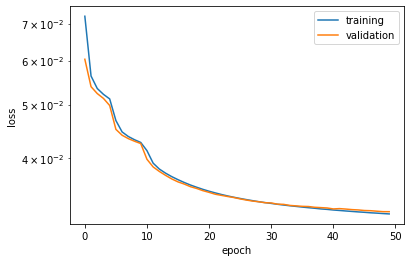

In [9]:
ae.plot_hist()

Let's visually compare network's output with the input

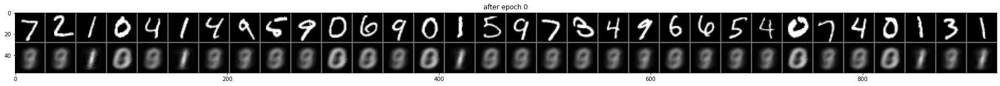

AttributeError: ignored

In [11]:
ae.plot_samples()

# Denoising Autoencoder

In denoising AE we create noisy samples and ask the model to reconstruct original (clean) samples. Here 20% of pixels will be corrupted.

In [ ]:
dae = AE((28,28), noise_rate=0.2, n_code=5)

In [ ]:
dae.summary()

Train same way as before:

In [ ]:
dae.fit(train_images, 50, validation_data=(test_images, test_labels), lr=0.0009, batch_size=128)

Plot loss history:

In [ ]:
dae.plot_hist()

Visualise evolution of reconstruction:

In [ ]:
dae.plot_samples()

# Exercise 1 

Use autoencoder to find outliers:
1. preform reconstruciton for test dataset
2. evaluate reconstruction loss and plot distrubution
3. visualise poorely reconstructed samples

Homework:
Perform 2D UMAP embedding of the raw data points and image encoding (variables in latent space) for test set, plot it and highlight outliers.

In [12]:
predictions=ae.predict(test_images)

In [13]:
predictions.shape

(10000, 28, 28)

In [14]:
losses=np.mean(np.mean((predictions-test_images)**2,1),1)

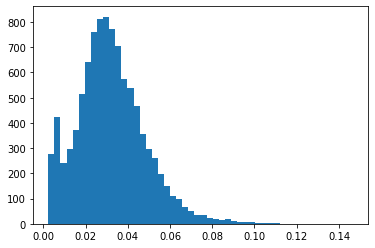

In [15]:
plt.hist(losses, bins=50)
plt.show()

In [16]:
outlayers = losses.argsort()[-32:]
outlayers

array([6391, 8047, 1128, 4317, 4078, 4086, 7905, 2770, 5605, 1790,   72,
       2292, 4294, 5644, 1325, 4177, 1782, 1221, 1601, 9116, 4176, 1467,
       7797, 4601, 6386, 6722, 2797, 7800, 4713, 6390,  998, 7821])

In [ ]:
losses[outlayers].min()

In [17]:
losses[outlayers]

array([0.09538116, 0.09548934, 0.09552236, 0.09561103, 0.09573996,
       0.09588032, 0.09613992, 0.09720556, 0.09814478, 0.09914796,
       0.09966867, 0.09973211, 0.09980215, 0.10014772, 0.10078388,
       0.1008719 , 0.10174473, 0.10228958, 0.10343692, 0.10377055,
       0.1042552 , 0.10810073, 0.10825337, 0.11014681, 0.11067643,
       0.11118139, 0.11242967, 0.11583547, 0.12995073, 0.13301335,
       0.14327869, 0.14648911], dtype=float32)

In [18]:
samples = [test_images[outlayers],predictions[outlayers]]

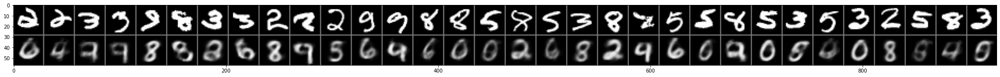

In [19]:
ny = len(samples)
nx = len(samples[0])
fig_scale=1
plt.figure(figsize=(fig_scale*nx, fig_scale*ny))
m = mosaic(samples)
plt.imshow(m, cmap='gray', vmin=0, vmax=1)
plt.tight_layout(0.1, 0, 0)
plt.show()
plt.close()

In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Embedding(10,2))
model.compile()

In [ ]:
umap_pred = model.predict(test_images)

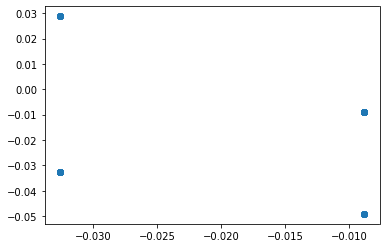

In [97]:
plt.scatter(umap_pred[:,0],umap_pred[:,1])
plt.scatter(umap_pred[outlayers,0],umap_pred[outlayers,1])

In [94]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter(umap[:,0],umap[:,1],umap[:,2])

Error in callback <function flush_figures at 0x7f85b5cab320> (for post_execute):


KeyboardInterrupt: ignored

In [98]:
umap.shape

(10000, 28, 28, 2)

In [106]:
!pip install umap-learn[plot]
!pip install holoviews
!pip install -U ipykernel

     |████████████████████████████████| 80 kB 2.8 MB/s 
     |████████████████████████████████| 1.1 MB 10.0 MB/s 
     |████████████████████████████████| 15.8 MB 652 bytes/s 
     |████████████████████████████████| 76 kB 5.1 MB/s 
     |████████████████████████████████| 125 kB 48.5 MB/s 
     |████████████████████████████████| 786 kB 36.0 MB/s 
     |████████████████████████████████| 779 kB 49.6 MB/s 
     |████████████████████████████████| 778 kB 51.5 MB/s 
     |████████████████████████████████| 776 kB 31.4 MB/s 
     |████████████████████████████████| 769 kB 45.2 MB/s 
     |████████████████████████████████| 766 kB 30.2 MB/s 
     |████████████████████████████████| 1.0 MB 43.8 MB/s 
     |████████████████████████████████| 722 kB 49.5 MB/s 
     |████████████████████████████████| 722 kB 49.3 MB/s 
     |████████████████████████████████| 715 kB 35.3 MB/s 
     |████████████████████████████████| 705 kB 40.2 MB/s 
     |████████████████████████████████| 699 kB 48.3 MB/s 
     |█████████

     |████████████████████████████████| 124 kB 5.3 MB/s 
     |████████████████████████████████| 788 kB 22.2 MB/s 
     |████████████████████████████████| 370 kB 41.6 MB/s 
  Attempting uninstall: prompt-toolkit
    Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Attempting uninstall: ipython
    Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 4.10.1
    Uninstalling ipykernel-4.10.1:
      Successfully uninstalled ipykernel-4.10.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyter-console 5.2.0 requires prompt-toolkit<2.0.0,>=1.0.0, but you have prompt-toolkit 3.0.20 which is incompatible.
google-colab 1.0.0 requ

In [20]:
import umap

In [26]:
train_images.shape

(60000, 28, 28)

In [29]:
sh = train_images.shape
train = train_images.reshape(sh[0],sh[1]*sh[2])

In [30]:
embedding = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(train)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


In [31]:
import umap.plot

In [34]:
type(embedding)

numpy.ndarray

In [35]:
embedding.shape

(60000, 2)

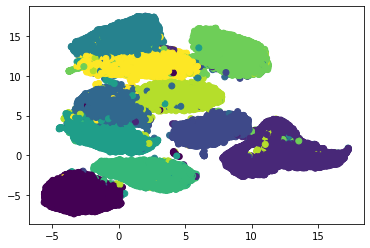

In [38]:
plt.scatter(embedding[:,0],embedding[:,1],c=train_labels)

In [39]:
sh = test_images.shape
test = test_images.reshape(sh[0],sh[1]*sh[2])

In [40]:
embedding = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(test)

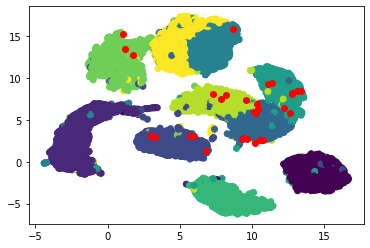

In [42]:
plt.scatter(embedding[:,0],embedding[:,1],c=test_labels)
plt.scatter(embedding[outlayers,0],embedding[outlayers,1],c='r')

# Convolutional autoencoder

Instead of fully connected layers we can use strided convolutional layers in encoder, and transposed convolutions in decoder.
This model will have less parameters due to weight sharing, thus easier to train.

After upscaling the image size will be a bit bigger then original, so we also crop reconstruction to the input image size.

In [6]:
class CAE(AE):
  def __init__(self, in_size, n_code, noise_rate=0):
    super().__init__(in_size, n_code, noise_rate)
    self.preflat_shape = 1

  def create(self):
    self.encoder = tf.keras.Sequential(
        [
         Input(shape=self.data_size),
         Reshape(target_shape = self.data_size+[1]),
         Conv2D(8, 3, padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2D(8, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2D(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2D(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2D(32, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Flatten(),
         Dense(self.n_code, activation='sigmoid', kernel_initializer='he_normal')
        ])
    
    self.preflat_shape = self.encoder.layers[-2].input.get_shape().as_list()[1:]
    
    self.decoder = tf.keras.Sequential(
        [
         Input(shape=self.n_code),
         Dense(np.prod(self.preflat_shape), activation='relu', kernel_initializer='he_normal'),
         Reshape(target_shape=self.preflat_shape),
         Conv2DTranspose(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(8, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2D(1, 3, strides=(1,1), padding='same', activation='relu', kernel_initializer='he_normal')
        ])
    
    h, w = self.decoder.layers[-1].output.get_shape().as_list()[1:3]  # reconstructed width and hight
    h_tgt, w_tgt = self.data_size[:2]  # target width and height
    dh = h - h_tgt  # deltas to be cropped away
    dw = w - w_tgt

    # add to decoder cropping layer and final reshaping
    self.decoder.add(Cropping2D(cropping=((dh//2, dh-dh//2), (dw//2, dw-dw//2))))
    self.decoder.add(Reshape(target_shape=self.data_size,))
         
    self.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
          loss=tf.keras.losses.MeanSquaredError(),
      )
    

  def call(self, x):
    return super().call(x)

Thus we can try to reduce sise of the latent space:

In [7]:
cae = CAE((28,28), noise_rate=0.2, n_code=2)

In [8]:
cae.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 28, 28, 8)         80        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 8)         584       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 7, 7, 16)          1168      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 16)          2320      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 2, 2, 32)          4640      
_________________________________________________________________
flatten (Flatten)            (None, 128)               0

In [9]:
cae.fit(train_images, 20, validation_data=(test_images, test_labels), lr=0.0018, batch_size=128)

Epoch 1/20
469/469 [==============================] - 9s 15ms/step - loss: 0.0586 - val_loss: 0.0525
Epoch 2/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0500 - val_loss: 0.0476
Epoch 3/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0468 - val_loss: 0.0458
Epoch 4/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0454 - val_loss: 0.0447
Epoch 5/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0445 - val_loss: 0.0436
Epoch 6/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0439 - val_loss: 0.0432
Epoch 7/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0432 - val_loss: 0.0430
Epoch 8/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0428 - val_loss: 0.0426
Epoch 9/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0424 - val_loss: 0.0420
Epoch 10/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0420 - val_lo

fit time 146 sec

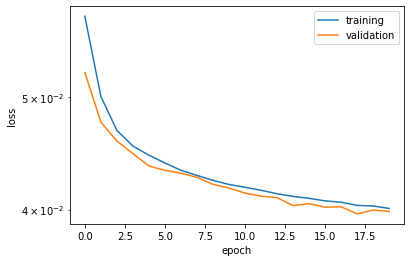

In [10]:
cae.plot_hist()

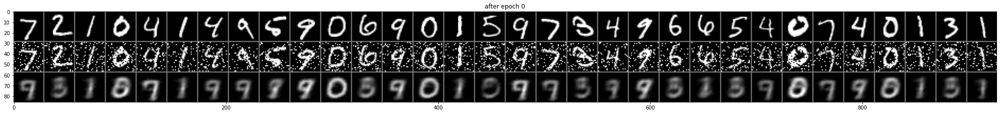

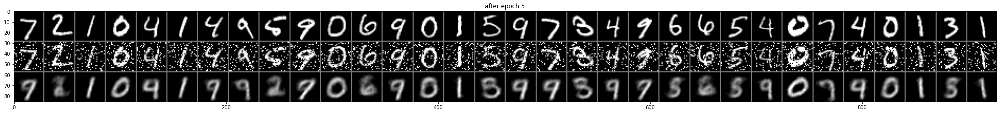

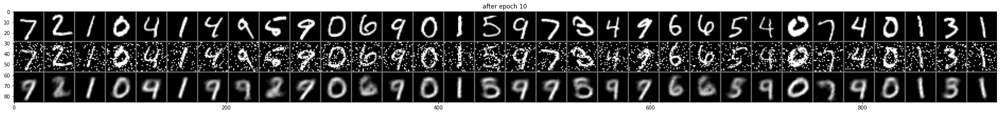

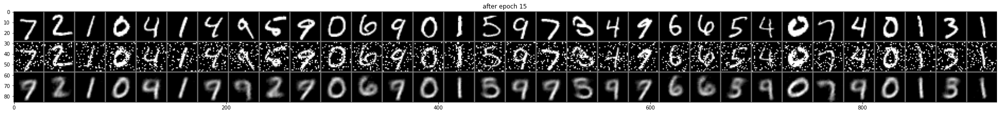

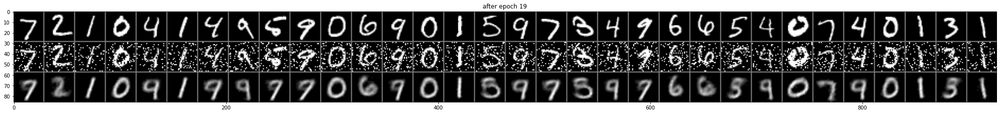

In [11]:
cae.plot_samples()

# Latent space

So far we looked just on the output: the model sort of does the job. But what does it learn?

first let's use animation to visualize reconstruction evolution:

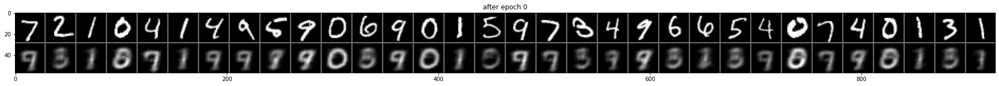

In [16]:
hist = cae.sample_history

smpl_epochs = list(hist.keys())

smpl_ims = [[hist[ep]['x'], hist[ep]['y']] for ep in smpl_epochs]

ny, nx = len(smpl_ims[0]), len(smpl_ims[0][0])

plt.rcParams["animation.html"] = "jshtml"  # for matplotlib 2.1 and above, uses JavaScript

s=1
fig = plt.figure(figsize=(s*nx, s*ny))

m = mosaic(smpl_ims[0])

ttl = plt.title(f'after epoch {int(0)}')
imsh = plt.imshow(m, cmap='gray', vmin=0, vmax=1)


def animate(i):
    m = mosaic(smpl_ims[i])
    imsh.set_data(m)

    ttl = plt.title(f'after epoch {i}')

    return imsh

ani = animation.FuncAnimation(fig, animate, frames=len(smpl_ims))

ani

And let's see evolution of the latent representations:

In [25]:
animateplt.rcParams["animation.html"] = "jshtml"  # for matplotlib 2.1 and above, uses JavaScript
fig = plt.figure(figsize=(8,8))

hist = cae.sample_history

smpl_epochs = list(hist.keys())

z_res = [hist[ep]['z_unif'] for ep in smpl_epochs]
l_res = [hist[ep]['l_unif'] for ep in smpl_epochs]


scat = plt.scatter(z_res[0][:,0], z_res[0][:,1], c=l_res[0], cmap=cm.rainbow)
plt.xlim(-0.1, 1.1)
plt.ylim(-0.1, 1.1)

legend1 = plt.gca().legend(*scat.legend_elements(), title="digits")
plt.gca().add_artist(legend1)
plt.gca().set_aspect('equal')
ttl = plt.title(f'after epoch {0}')(i):
    z = z_res[i]
    scat.set_offsets(z)
    ttl = plt.title(f'after epoch {i}')
    return scat

ani = animation.FuncAnimation(fig, animate, frames=len(z_res))

ani

SyntaxError: ignored

# Sampling from latent space

But we can also use the trained model to generate samples based on the latent representation:

In [ ]:
z0 = np.random.uniform(size=(20, 2))

ims_all = []
def fn(ae):
  ims = ae.decode(z0)
  ims_all.append(ims)

cae.run_on_all_training_history(fn)

In [ ]:
fig = plt.figure(figsize=(10, 1.5))

m = mosaic([ims_all[0]])

imsh = plt.imshow(m, cmap='gray', vmin=0, vmax=1)
ttl = plt.title(f'after epoch {int(0)}')


def animate(i):
    m = mosaic([ims_all[i]])
    imsh.set_data(m)
    ttl = plt.title(f'after epoch {i}')
    return imsh

ani = animation.FuncAnimation(fig, animate, frames=len(ims_all))

ani

# Interpolation in latent space

In [ ]:
zs = np.meshgrid(np.linspace(0, 1, 10),
                 np.linspace(0, 1, 10))
zs = np.stack(zs, axis=-1)

In [ ]:
def fn(ae):
  ims = ae.decode(zs.reshape((-1, 2))).numpy()
  sh = list(ims.shape)
  ims = ims.reshape([10, 10]+sh[1:])
  plt.figure(figsize=(10, 10))
  plt.imshow(mosaic(ims[::-1]), vmin=0, vmax=1, cmap='gray')
  plt.show()

cae.run_on_trained(fn)


# Exercise 2



Option 1. Compare distribution in latent space for noise rate 0, 0.2, 0.6, 0.8.

Option 2. Compare reconstruction depending on size of latent space: 2, 4, 8, 16, 32

In [12]:
cae06 = CAE((28,28), noise_rate=0.6, n_code=2)

In [13]:
cae08 = CAE((28,28), noise_rate=0.8, n_code=2)

In [14]:
cae0 = CAE((28,28), noise_rate=0, n_code=2)

In [15]:
cae02=cae

In [18]:
cae06.fit(train_images, 20, validation_data=(test_images, test_labels), lr=0.0018, batch_size=128)

Epoch 1/20
469/469 [==============================] - 8s 14ms/step - loss: 0.0630 - val_loss: 0.0577
Epoch 2/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0568 - val_loss: 0.0552
Epoch 3/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0541 - val_loss: 0.0516
Epoch 4/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0519 - val_loss: 0.0492
Epoch 5/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0505 - val_loss: 0.0483
Epoch 6/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0495 - val_loss: 0.0483
Epoch 7/20
469/469 [==============================] - 6s 14ms/step - loss: 0.0487 - val_loss: 0.0477
Epoch 8/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0480 - val_loss: 0.0461
Epoch 9/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0474 - val_loss: 0.0450
Epoch 10/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0469 - val_lo

fit time 147 sec

In [19]:
cae0.fit(train_images, 20, validation_data=(test_images, test_labels), lr=0.0018, batch_size=128)

Epoch 1/20
469/469 [==============================] - 8s 14ms/step - loss: 0.0573 - val_loss: 0.0523
Epoch 2/20
469/469 [==============================] - 6s 14ms/step - loss: 0.0503 - val_loss: 0.0484
Epoch 3/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0475 - val_loss: 0.0466
Epoch 4/20
469/469 [==============================] - 6s 14ms/step - loss: 0.0459 - val_loss: 0.0455
Epoch 5/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0448 - val_loss: 0.0443
Epoch 6/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0441 - val_loss: 0.0439
Epoch 7/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0436 - val_loss: 0.0435
Epoch 8/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0430 - val_loss: 0.0430
Epoch 9/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0426 - val_loss: 0.0422
Epoch 10/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0422 - val_lo

fit time 129 sec

In [20]:
cae08.fit(train_images, 20, validation_data=(test_images, test_labels), lr=0.0018, batch_size=128)

Epoch 1/20
469/469 [==============================] - 8s 14ms/step - loss: 0.0664 - val_loss: 0.0600
Epoch 2/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0630 - val_loss: 0.0584
Epoch 3/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0623 - val_loss: 0.0578
Epoch 4/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0618 - val_loss: 0.0574
Epoch 5/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0615 - val_loss: 0.0574
Epoch 6/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0610 - val_loss: 0.0559
Epoch 7/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0605 - val_loss: 0.0561
Epoch 8/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0601 - val_loss: 0.0577
Epoch 9/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0598 - val_loss: 0.0554
Epoch 10/20
469/469 [==============================] - 6s 13ms/step - loss: 0.0593 - val_lo

fit time 147 sec

In [23]:
def plotDist(cae_in):
  animateplt.rcParams["animation.html"] = "jshtml"  # for matplotlib 2.1 and above, uses JavaScript
  fig = plt.figure(figsize=(8,8))

  hist = cae_in.sample_history

  smpl_epochs = list(hist.keys())

  z_res = [hist[ep]['z_unif'] for ep in smpl_epochs]
  l_res = [hist[ep]['l_unif'] for ep in smpl_epochs]


  scat = plt.scatter(z_res[0][:,0], z_res[0][:,1], c=l_res[0], cmap=cm.rainbow)
  plt.xlim(-0.1, 1.1)
  plt.ylim(-0.1, 1.1)

  legend1 = plt.gca().legend(*scat.legend_elements(), title="digits")
  plt.gca().add_artist(legend1)
  plt.gca().set_aspect('equal')
  ttl = plt.title(f'after epoch {0}')(i):
    z = z_res[i]
    scat.set_offsets(z)
    ttl = plt.title(f'after epoch {i}')
    return scat

  ani = animation.FuncAnimation(fig, animate, frames=len(z_res))

  ani

SyntaxError: ignored

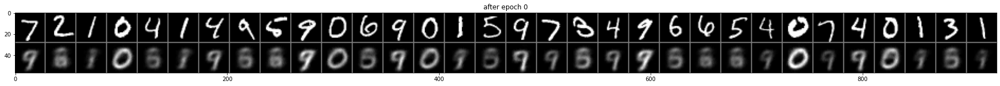

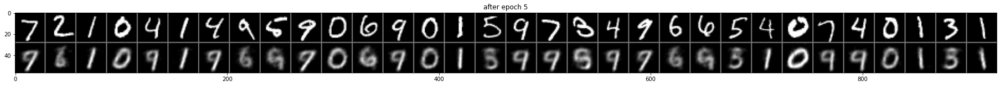

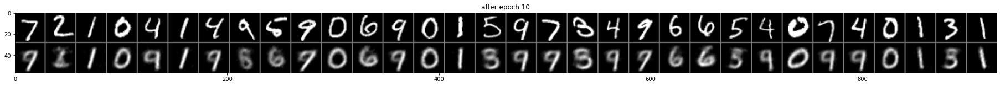

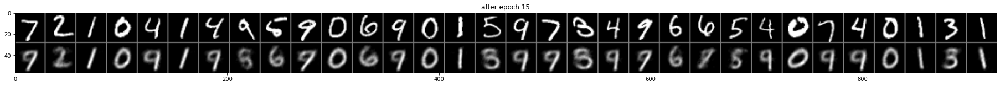

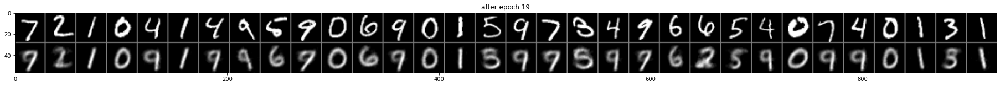

In [21]:
cae0.plot_samples()

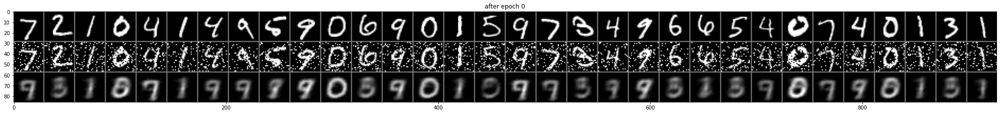

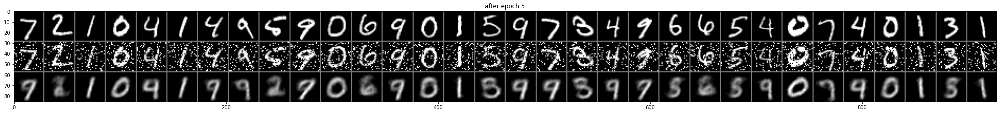

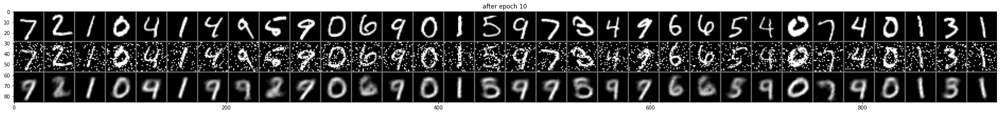

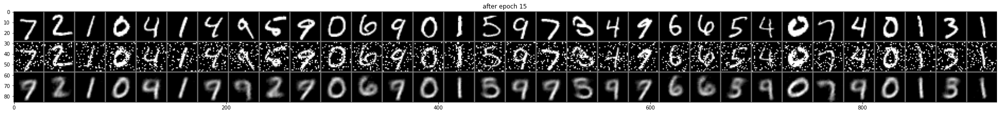

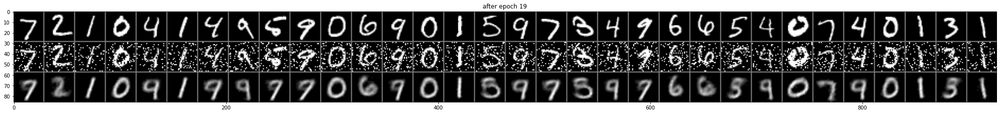

In [26]:
cae02.plot_samples()

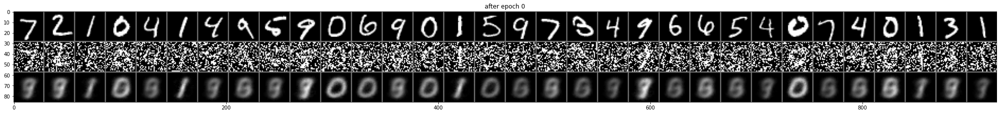

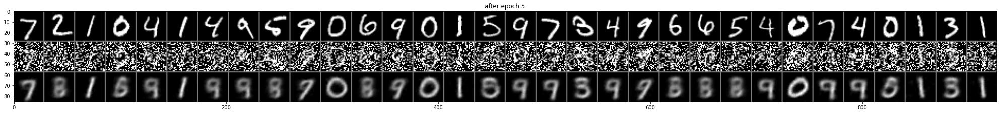

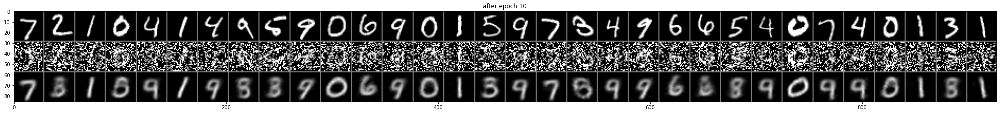

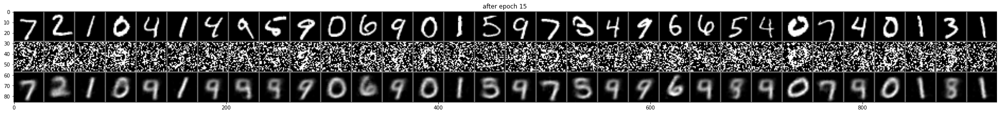

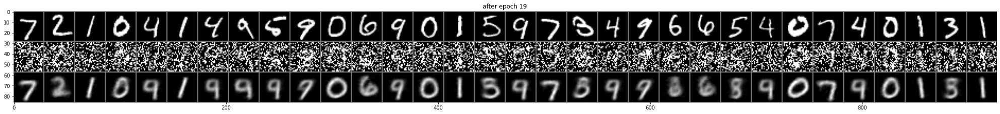

In [27]:
cae06.plot_samples()

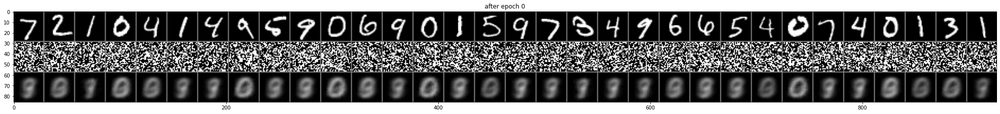

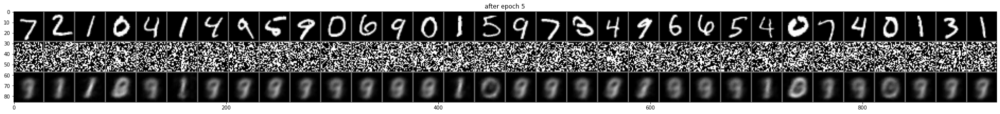

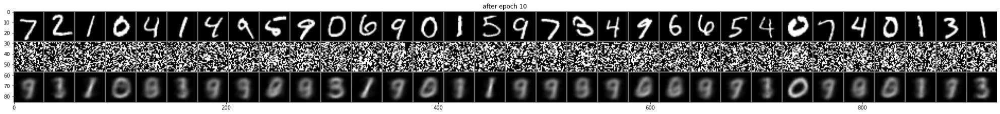

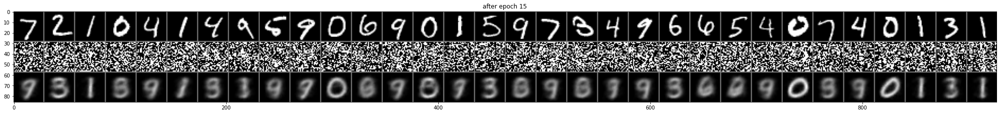

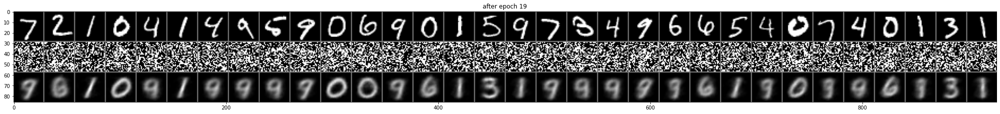

In [28]:
cae08.plot_samples()

# VAE

While the previous model learn to seaparate subpopulations in the latent space, there remains significant overlap & unpopulated regions.

Varitional AE puts additional constraints on the distribution in the latent space and perform variational inference.

(see pptx for details)

Here the encoder will predict `2 x n_code` values: means and logarithm of variance for each sample. Since these values live in $R^2$ - no activation function is used in last layer of the encoder.

Then for reconstruction we will sample from this distribuition with a reparametrisation trick.

The tecnically complex part - implement custom loss function and training loop.

In [ ]:
class VCAE(AE):
  def __init__(self, in_size, n_code, noise_rate=0):
    super().__init__(in_size, n_code, noise_rate)
    self.preflat_shape = 1

  def create(self):
    self.encoder = tf.keras.Sequential(
        [
         Input(shape=self.data_size),
         Reshape(target_shape = self.data_size+[1]),
         Conv2D(16, 3,                padding='same', activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Conv2D(16, 3, strides=(2,2), padding='same', activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Conv2D(32, 3, strides=(2,2), padding='same', activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Conv2D(32, 3, strides=(2,2), padding='same', activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Conv2D(32, 3, strides=(2,2), padding='same', activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Conv2D(64, 3, strides=(2,2), padding='same', activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Flatten(),
         Dense(64, activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Dense(self.n_code * 2, kernel_initializer='he_normal')
        ])
    
    self.preflat_shape = self.encoder.layers[-3].input.get_shape().as_list()[1:]
    
    self.decoder = tf.keras.Sequential(
        [
         Input(shape=self.n_code),
         Dense(64,                          activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Dense(np.prod(self.preflat_shape), activation=LeakyReLU(alpha=0.3), kernel_initializer='he_normal'),
         Reshape(target_shape=self.preflat_shape),
         Conv2DTranspose(32, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(32, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(32, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2DTranspose(16, 3, strides=(2,2), padding='same', activation='relu', kernel_initializer='he_normal'),
         Conv2D(1, 3, strides=(1,1), padding='same', activation='sigmoid', kernel_initializer='he_normal'),
        ])
    
    h, w = self.decoder.layers[-1].output.get_shape().as_list()[1:3]
    h_tgt, w_tgt = self.data_size[:2]
    dh = h - h_tgt
    dw = w - w_tgt

    self.decoder.add(Cropping2D(cropping=((dh//2, dh-dh//2), (dw//2, dw-dw//2))))
    self.decoder.add(Reshape(target_shape=self.data_size,))
         
    self.optimizer = tf.keras.optimizers.Adam(1e-4)
    
  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.n_code))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    z_mean, z_logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return z_mean, z_logvar
   
  def reparameterize(self, z_mean, z_logvar):
    eps = tf.random.normal(shape=z_mean.shape)
    return eps * tf.exp(z_logvar * .5) + z_mean

  def call(self, x):
    z_mean, z_logvar = self.encode(x)
    z = self.reparameterize(z_mean, z_logvar)
    y = self.decode(z)
    return y

  def compute_loss(self, x, y):
    z_mean, z_logvar = self.encode(x)
    z = self.reparameterize(z_mean, z_logvar)
    y_pred = self.decode(z)  # w/o activation, thus not `decode` function

    l2 = tf.math.squared_difference(y, y_pred)
    reconstruction_loss = tf.reduce_mean(l2)  # we use mean instead of sum so that loss values are comparable with other methods
    
    loss_z = 0.5 * tf.reduce_sum(tf.exp(z_logvar) + tf.square(z_mean) -1.0 - z_logvar, axis=1) 
    loss = tf.reduce_mean(loss_z) / np.prod(self.data_size)  # but since we used mean in reconstruction loss - this term has to be normalized accordingly
    
    return reconstruction_loss + loss
    
  @tf.function
  def train_step(self, x, y):
    """Executes one training step and returns the loss.

    This function computes the loss and gradients, and uses the latter to
    update the model's parameters.
    """
    with tf.GradientTape() as tape:
      loss = self.compute_loss(x, y)
    gradients = tape.gradient(loss, self.trainable_variables)
    self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
    return loss

  def _fit(self, x, y, epochs, batch_size,
           validation_data, callbacks):
    
    # finally we have to implement custom training loop

    h = tf.keras.callbacks.History()
    h.history['loss'] = []
    h.history['val_loss'] = []
    
    for epoch in range(1, epochs + 1):
      start_time = time.time()
      n_smpl = len(x)
      idx = np.random.permutation(n_smpl)
      
      x_permuted, y_permuted = x[idx], y[idx]
      n_batch = n_smpl // batch_size

      loss = 0
      for batch_idx in range(n_batch):
        x_batch = x_permuted[batch_idx * batch_size : (batch_idx+1) * batch_size]
        y_batch = y_permuted[batch_idx * batch_size : (batch_idx+1) * batch_size]

        loss += self.train_step(x_batch, y_batch).numpy()  # actual training update
      
      h.history['loss'].append(loss/n_batch)

      end_time = time.time()

      mean_loss = tf.keras.metrics.Mean()
      val_x, val_y = validation_data
      n_smpl = len(val_x)
      n_batch = n_smpl // batch_size
      for batch_idx in range(n_batch):
        x_batch = val_x[batch_idx * batch_size : (batch_idx+1) * batch_size]
        y_batch = val_y[batch_idx * batch_size : (batch_idx+1) * batch_size]
        loss = self.compute_loss(x_batch, y_batch)
        mean_loss(loss)

      loss_mean = mean_loss.result()

      h.history['val_loss'].append(loss_mean.numpy())
      IPython.display.clear_output(wait=False)
      print('Epoch: {}, Test set loss: {}, time elapse for current epoch: {}'
            .format(epoch, loss_mean, end_time - start_time))
 
      for callback in callbacks:
        callback.on_epoch_end(epoch, logs=None)

    return h

In [ ]:
vcae = VCAE((28,28), noise_rate=0., n_code=2)

In [ ]:
vcae.summary()

In [ ]:
vcae.fit(train_images, 25, validation_data=(test_images, test_labels), lr=0.0009, batch_size=128) 
        

In [ ]:
vcae.plot_hist()

Visualize reconstruciton:

In [ ]:
hist = vcae.sample_history

smpl_epochs = list(hist.keys())

smpl_ims = [[hist[ep]['x'][:10], hist[ep]['y'][:10]] for ep in smpl_epochs]

ny, nx = len(smpl_ims[0]), len(smpl_ims[0][0])

plt.rcParams["animation.html"] = "jshtml"  # for matplotlib 2.1 and above, uses JavaScript

s=1
fig = plt.figure(figsize=(s*nx, s*ny))

m = mosaic(smpl_ims[0])

ttl = plt.title(f'after epoch {int(0)}')
imsh = plt.imshow(m, cmap='gray', vmin=0, vmax=1)


def animate(i):
    m = mosaic(smpl_ims[i])
    imsh.set_data(m)

    ttl = plt.title(f'after epoch {i}')

    return imsh

ani = animation.FuncAnimation(fig, animate, frames=len(smpl_ims))

ani

Let's look at the latent representation:

In [ ]:
plt.rcParams["animation.html"] = "jshtml"  # for matplotlib 2.1 and above, uses JavaScript
fig = plt.figure(figsize=(8,8))

hist = vcae.sample_history

smpl_epochs = list(hist.keys())

z_res = [hist[ep]['z_unif'][:, :2] for ep in smpl_epochs]
l_res = [hist[ep]['l_unif'] for ep in smpl_epochs]


scat = plt.scatter(z_res[0][:,0], z_res[0][:,1], c=l_res[0], cmap=cm.rainbow)
plt.xlim(-3, 3)
plt.ylim(-3, 3)

legend1 = plt.gca().legend(*scat.legend_elements(), title="digits")
plt.gca().add_artist(legend1)
plt.gca().set_aspect('equal')
ttl = plt.title(f'after epoch {0}')

def animate(i):
    z = z_res[i]
    scat.set_offsets(z)
    ttl = plt.title(f'after epoch {i}')
    return scat

ani = animation.FuncAnimation(fig, animate, frames=len(z_res))

ani

In [ ]:
np.std(np.random.normal(size=1000) * np.exp(np.log(4) * .5))

And let's sample from the latent space:

In [ ]:
n = 15
zs = np.meshgrid(norm.ppf(np.linspace(0.003, 0.997, n)),  # sampling proportionally to the density
                 norm.ppf(np.linspace(0.003, 0.997, n)))
zs = np.stack(zs, axis=-1)

def fn(ae):
  ims = ae.decode(zs.reshape((-1, 2))).numpy()
  sh = list(ims.shape)
  ims = ims.reshape([n, n]+sh[1:])
  plt.figure(figsize=(n, n))
  plt.imshow(mosaic(ims[::-1]), vmin=0, vmax=1, cmap='gray')
  plt.show()

vcae.run_on_trained(fn)


# Visualization excercise

Option 1: Sample 31x31 and overlay with data points.

Option 2: Visulize data-point in latent space


```
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

plt.figure(figsize=(10,10))
ax = plt.gca()

for x_i, y_i, im_i in zip(x_arr, y_arr, images):
    im = OffsetImage(im_i, zoom=0.5)
    ab = AnnotationBbox(im, (x_i, y_i), xycoords='data', frameon=False)

    ax.add_artist(ab)
    ax.update_datalim([(x_i, y_i)])
    ax.autoscale()

```

# Exercise 3


## Option 1. 

Use VAE to explore Fashion MNIST
 1. train model
 2. explore latent representation
 3. find outliers
 4. sample from the latent distribution
 5. overlay with data points

## Option 2. 


Use CAE to explore molecule images dataset

 1. train model
 2. explore latent representation
 3. find outliers
 4. sample from the latent distribution

In [ ]:
#zinc usage example:

#download and unpack
fname = 'named_in_cells_pics_w64.zip'
zinc_path = 'ZINC_data'

In [ ]:
url = 'https://github.com/sigvehaug/CAS-AML-M3/blob/main/named_in_cells_pics_w64.zip?raw=true'
r = requests.get(url, allow_redirects=True)
open(fname, 'wb').write(r.content)
with zipfile.ZipFile(fname, 'r') as zip_ref:
    zip_ref.extractall(zinc_path)

In [ ]:
def load_ims(path):
  files = glob.glob(path+'/named_in_cells_pics_w64/*.png')

  ims = [(np.asarray(Image.open(fname))/255.).astype(np.float32) for fname in files]

  return np.array(ims)

In [ ]:
zinc_ims = load_ims(zinc_path)

In [ ]:
zinc_ims = 1 - zinc_ims

In [ ]:
print(zinc_ims.shape)

In [ ]:
plt.imshow(zinc_ims[0], cmap='gray')

## Option 3. 


Use CAE to explore molecule text description (SMILE) dataset

 1. train model
 2. explore latent representation
 4. sample from the latent distribution

In [ ]:
import collections
import pickle

with open(zinc_path+'/id_zinc_smile.pckl', 'rb') as f:
  id_to_zinc_smile_20 = pickle.load(f)
smiles = [smile for c,smile in id_to_zinc_smile_20.values()]
smiles_padded = [smile + ' ' * (25-len(smile)) for smile in smiles]

smiles_all = ''.join(smiles_padded)

def build_dataset(words):
    count = collections.Counter(words).most_common()
    dictionary = {}
    for word, _ in count:
        dictionary[word] = len(dictionary)
    reverse_dictionary = dict(zip(dictionary.values(), dictionary.keys()))
    return dictionary, reverse_dictionary

dictionary, reverse_dictionary = build_dataset(smiles_all)

smiles_as_int = np.array( [[dictionary[c] for c in smile] for smile in smiles_padded])
print(smiles_as_int[2])

## Option 4.


Use CAE to explore waveform dataset

1. Build 1D convolutional autoencoder with 32 latent values
2. Visualise evolution of each of the parameters along the track
3. Visualise evolution of each of the parameters along the track averaged per bar (16 16th)
4. Play reconstruction.

In [ ]:
import soundfile as sf 

In [ ]:
fname = '01. Phaxe & Morten Granau - The Collective (Original Mix)_137bpm_G.flac'

In [ ]:
url = #
r = requests.get(url, allow_redirects=True)
open(fname, 'wb').write(r.content)

In [ ]:
path = fname                                                  
data, samplerate = sf.read(path, dtype='float32')
print(data.shape, samplerate)

In [ ]:
#remove silence in the beginning
data = data[19801:]

In [ ]:
bpm = 137
dt_beat = 60 / bpm  # sec
samples_per_beat_f = dt_beat * samplerate
samples_per_16th_f = samples_per_beat_f / 16

samples_per_16th_i = int(samples_per_16th_f)

print(samples_per_16th_f)

In [ ]:
n_16th = int(len(data) / samples_per_16th_f)

one_16th_chunks = [data[int(i*samples_per_16th_f): int(i*samples_per_16th_f) + samples_per_16th_i] for i in range(n_16th-1)]
one_16th_chunks = np.array(one_16th_chunks)

In [ ]:
one_16th_chunks.shape

In [ ]:
plt.plot(one_16th_chunks[::1000, :, 0].T);

Let's play first 16 bar:

In [ ]:
samples_per_block = int(samples_per_16th_f * 16 * 4 * 16)

Audio(data[:samples_per_block].T, rate=samplerate, )

In [ ]:
# first kick

In [ ]:
plt.plot(one_16th_chunks[16*4*16*2])

In [ ]:
Audio(one_16th_chunks[16*4*16*2].T, rate=samplerate, )